# Deep Layout Parsing (adapted for the Uppsala Events Guide Project)

In this tutorial, we will show how to use the `layoutparser` API to 

1. Load Deep Learning Layout Detection models and predict the layout of the paper image
2. Use the coordinate system to parse the output 

The `paper-image` is from https://arxiv.org/abs/2004.08686.

Fixes implemented from here: https://github.com/pradhanhitesh/LayoutParser-Install

In [175]:
#! pip install layoutparser
# ! pip install 'git+https://github.com/facebookresearch/detectron2.git@ff53992b1985b63bd3262b5a36167098e3dada02' pillow

In [416]:
import layoutparser as lp
import cv2, numpy as np

## Use Layout Models to detect complex layout 

`layoutparser` can identify the layout of the given document with only 4 lines of code.

In [511]:
image = cv2.imread("../../greyscaled.jpeg")
#image2 = cv2.imread("../../besokskarta-destination-uppsala-2025-1b.png")
image = image[..., ::-1]
# Convert the image from BGR (cv2 default loading style)
# to RGB

#model = lp.Detectron2LayoutModel('lp://PubLayNet/faster_rcnn_R_50_FPN_3xconfig',
#                                 extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8],
#                                 label_map={0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"})

#model = lp.models.detectron2.Detectron2LayoutModel('lp://PubLayNet/faster_rcnn_R_50_FPN_3x/config', 
#                                 extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8],
#                                 label_map={0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"})
    # Load the deep layout model from the layoutparser API 
    # For all the supported model, please check the Model 
    # Zoo Page: https://layout-parser.readthedocs.io/en/latest/notes/modelzoo.html

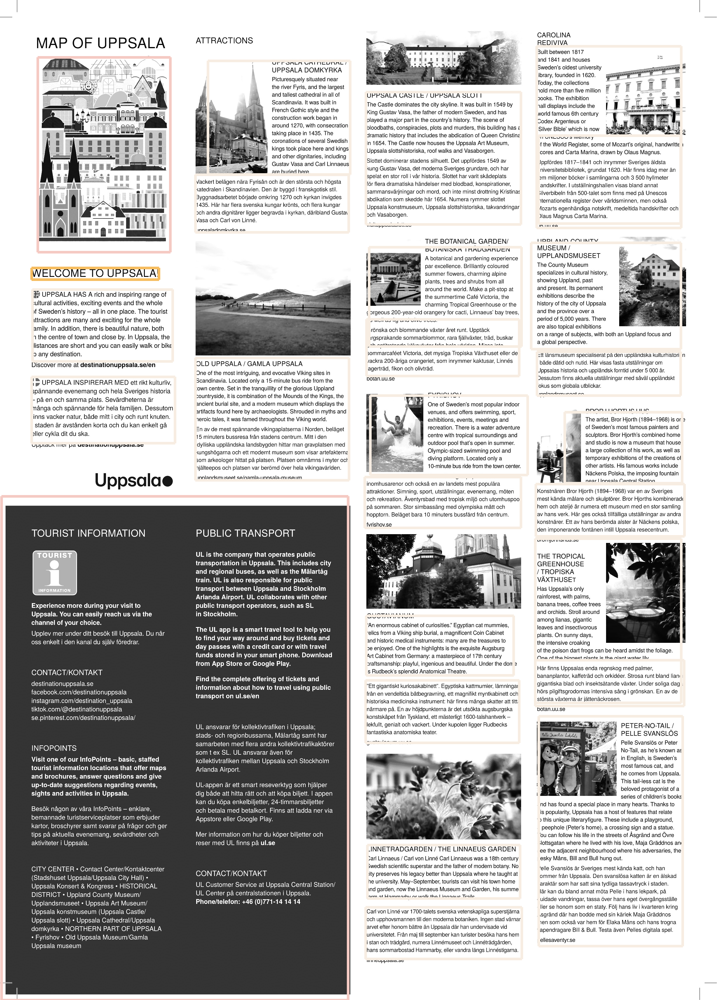

In [576]:
from layoutparser.models.detectron2 import catalog
import copy
import os
import requests as requests

def load_model(
    config_path: str = 'lp://<dataset_name>/<model_name>/config',
):

    config_path_split = config_path.split('/')
    dataset_name = config_path_split[-3]
    model_name = config_path_split[-2]

    # get the URLs from the MODEL_CATALOG and the CONFIG_CATALOG 
    # (global variables .../layoutparser/models/detectron2/catalog.py)
    model_url = catalog.MODEL_CATALOG[dataset_name][model_name]
    config_url = catalog.CONFIG_CATALOG[dataset_name][model_name]

    # override folder destination:
    if 'model' not in os.listdir():
        os.mkdir('model')

    config_file_path, model_file_path = None, None

    for url in [model_url, config_url]:
        filename = url.split('/')[-1].split('?')[0]
        save_to_path = f"model/" + filename
        if 'config' in filename:
            config_file_path = copy.deepcopy(save_to_path)
        if 'model_final' in filename:
            model_file_path = copy.deepcopy(save_to_path)

        # skip if file exist in path
        if filename in os.listdir("model"):
            continue
        # Download file from URL
        r = requests.get(url, stream=True, headers={'user-agent': 'Wget/1.16 (linux-gnu)'})

        with open(save_to_path, "wb") as f:
            for chunk in r.iter_content(chunk_size=4096):
                if chunk:
                    f.write(chunk)


    return lp.models.Detectron2LayoutModel(
        config_path=config_file_path,
        model_path=model_file_path,
        extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.58],
        label_map={0: "Text", 1: "Title"}
    )

# Load the model
model = load_model('lp://PubLayNet/mask_rcnn_X_101_32x8d_FPN_3x/config')
#model = load_model('lp://PubLayNet/mask_rcnn_R_50_FPN_3x/config')
layout = model.detect(image)
# Detect the layout of the input image
lp.draw_box(image, layout, box_width=9)
# Show the detected layout of the input image

## Check the results from the model 

In [673]:
type(layout)

layoutparser.elements.layout.Layout

The `layout` variable is a `Layout` instance, which is inherited from list and supports handy methods for layout processing.

In [674]:
layout[0]

TextBlock(block=Rectangle(x_1=1258.9493408203125, y_1=2893.7587890625, x_2=1781.5748291015625, y_2=3076.556396484375), text=None, id=None, type=Text, parent=None, next=None, score=0.9907750487327576)

`layout` contains a series of `TextBlock`s. They store the coordinates in the `.block` variable and other information of the blocks like block type in `.type`, text in `.text`, etc. More information can be found at the [documentation](https://layout-parser.readthedocs.io/en/latest/api_doc/elements.html#layoutparser.elements.TextBlock). 

## Use the coordinate system to process the detected layout

Firstly we filter text regions of specific type:

In [691]:
text_blocks = lp.Layout([b for b in layout if b.type=='Text'])
figure_blocks = lp.Layout([b for b in layout if b.type=='Figure'])

As you will see below, the text recognized as section 5.2 will be dropped
from our layout-recognized text regions as it is parsed as a TextBlock of
type 'Title' as indicated by its different colored bounding box in the image
above.

As there could be text regions detected inside the figure region, we just drop them:

In [692]:
text_blocks = lp.Layout([b for b in text_blocks \
                   if not any(b.is_in(b_fig) for b_fig in figure_blocks)])

Finally, sort the text regions and assign ids:

In [693]:
h, w = image.shape[:2]

left_interval = lp.Interval(0, w/2*1.05, axis='x').put_on_canvas(image)

left_blocks = text_blocks.filter_by(left_interval, center=True)
left_blocks.sort(key = lambda b:b.coordinates[1], inplace=True)
# The b.coordinates[1] corresponds to the y coordinate of the region
# sort based on that can simulate the top-to-bottom reading order 
right_blocks = lp.Layout([b for b in text_blocks if b not in left_blocks])
#right_blocks.sort(key = lambda b:b.coordinates[1], inplace=True)
right_blocks=sorted(right_blocks,key = lambda b:b.coordinates[1])

# And finally combine the two lists and add the index
text_blocks = lp.Layout([b.set(id = idx) for idx, b in enumerate(left_blocks + right_blocks)])

Visualize the cleaned text blocks:

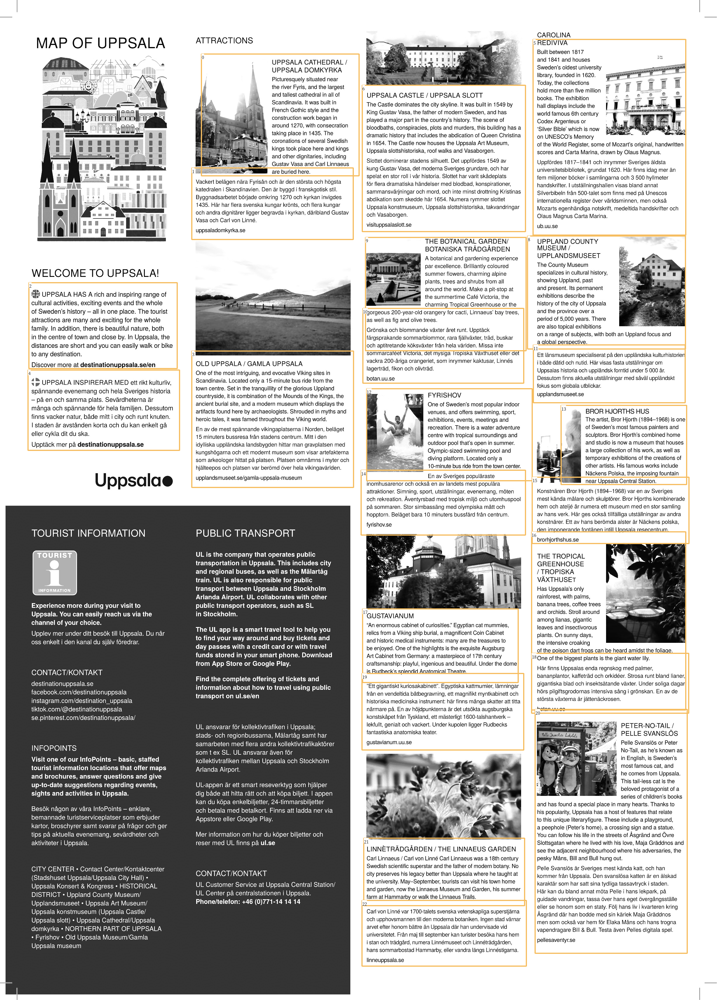

In [704]:
modified_text_blocks = [(block.pad(left=12, right=15, top=24, bottom=25)) for block in text_blocks]

## FURTHER TUNING
modified_text_blocks[0] = modified_text_blocks[0].pad(left=10, right=15, bottom=-20)
modified_text_blocks[8] = modified_text_blocks[8].pad(bottom=-25)
modified_text_blocks[9] = modified_text_blocks[9].pad(top=10, bottom=-10)
modified_text_blocks[10] = modified_text_blocks[10].pad(top=14)
modified_text_blocks[12] = modified_text_blocks[12].pad(bottom=-5)
modified_text_blocks[13] = modified_text_blocks[13].pad(bottom=-20)
modified_text_blocks.pop(7)

lp.draw_box(image, modified_text_blocks,
            box_width=4, 
            show_element_id=True)

## Fetch the text inside each text region

We can also combine with the OCR functionality in `layoutparser` to fetch the text in the document. 

In [369]:
#! pip install "layoutparser[ocr]"

In [1]:
ocr_agent = lp.TesseractAgent(languages=['eng'])
# Initialize the tesseract ocr engine. You might need 
# to install the OCR components in layoutparser: ! pip install "layoutparser[ocr]"
# OR restart your Python kernel
for block in modified_text_blocks:
    segment_image = (block
                       .crop_image(image))
        # add padding in each image segment can help
        # improve robustness 
        
    text = ocr_agent.detect(segment_image)
    block.set(text=text, inplace=True)

for txt in modified_text_blocks:
    print(txt.text, end='\n---\n')

NameError: name 'lp' is not defined

In [3]:
from langchain_core.documents import Document
from langchain_elasticsearch import ElasticsearchStore
from langchain_elasticsearch import DenseVectorStrategy
import os
from langchain_huggingface.embeddings import HuggingFaceEmbeddings
embedding = HuggingFaceEmbeddings(model_name="google/embeddinggemma-300m")

vector_store = ElasticsearchStore(
    es_cloud_id=os.getenv('ELASTIC_CLOUD_ID'),
    es_api_key=os.getenv('ELASTIC_API_KEY'),
    index_name="langchain_index",
    embedding=embedding,
    strategy=DenseVectorStrategy(hybrid=True)
)
with open("ocr_output.txt", "r") as f:
    txt = f.read()
    chunks = txt.split('\n---\n') # using the same ending sequence
    docs = [Document(page_content=f'Attractions - {chunk}') for chunk in chunks]
    
vector_store.add_documents(documents=docs)

['a8401e1c-6c28-41c2-a5e3-961b5ec7e5b7',
 'f1d5ce3a-8825-4f91-bd7e-af8392e6c9f1',
 '824012c1-fc21-4367-a3c9-67fd10b0972b',
 '8316eed1-7200-40d9-8bdb-a724fc66e336',
 'ec2febf0-ded6-45bc-91ea-75b026605fd5',
 '00f0294e-e62c-4fe7-9f90-297e99058af6',
 '58be9c2a-6e61-4590-952a-88307aec5e8b',
 'f88f0d6f-7951-4318-8f16-623c6b73d0ef',
 '69fdc72b-595e-4a51-aab1-a59ab8b1f976',
 '468751da-35d3-4d94-9e27-b5a9af5ace36',
 '1bf7da0e-bdd9-401e-9247-1badfcb7caea',
 '8a876a62-cced-49fd-87ea-6cfcb0d4cd99',
 'd1ece9d0-73d5-4a82-9a8a-ccf4eac0b57c',
 '5e751642-d553-4f01-bdb1-31047bef4f6b',
 '241ff99e-2680-4ae7-9042-bbe8a253a98b',
 'd4c281e7-bf47-4dfd-8711-246c222b5521',
 'fb918d9f-b747-43f8-976f-1e4c11047b11',
 '20c64f1b-442d-4bbf-ab58-6a78f9e86ac6',
 '60313319-5fd6-46b7-afd9-26c09db41305',
 'b7b70ad3-230a-400f-bdfa-6c9a8c167382',
 'ce433cf8-291d-4cd0-92b9-26864fafbc3b',
 '8adfa267-29ed-4692-9a86-5a8afd4520b2']